## Obtaining Images & Data

Source: the Claude Monet Gallery http://www.cmonetgallery.com/monet-paintings-list.aspx

In [69]:
import pandas as pd

# Web scraping
import requests
import xmltodict
import re # Regular Expressions
from bs4 import BeautifulSoup
import urllib

url = "http://www.the-athenaeum.org/art/list.php?s=tu&m=a&aid=13&p=2"

page = requests.get(url)

soup = BeautifulSoup(page.text)
data = []

for page in range(1,14):
    # Get page from site
    url = "http://www.the-athenaeum.org/art/list.php?s=tu&m=a&aid=13&p=" + str(page)
    page = requests.get(url)
    soup = BeautifulSoup(page.text)
    
    # Find all the rows in the data table
    art_table_rows = soup.findAll('tr', {'class': re.compile("r1|r2")})

    for row in art_table_rows:

        # Save description text for good luck
        desc = row.findAll('td')[1].get_text()

        # Artwork title
        title = row.find('div', {'class': 'list_title'}).get_text()

        # Year(s) created (may be a range, will deal with that later)
        p = re.compile('\((\d*|\d*-\d*)\)')
        m = p.search(desc)
        if (m):
            year = m.groups()[0]
        else:
            year = []

        # Media art was created in (if listed)
        p = re.compile('(pastel|oil|tempera)')
        m = p.search(desc)
        if(m): 
            medium = m.groups()[0]
        else:
            medium = []

        # Save image files
        img_link = row.find('img', {'vspace': '4'}).get('src')
        if (img_link):
            file_id_thumb = int(float(img_link.replace('display_image.php?id=','')))
            file_id_full = file_id_thumb + 1
            out = urllib.urlretrieve(image_base_url + str(file_id_thumb), 'images/' + str(file_id_thumb) +'.jpg')
            out2 = urllib.urlretrieve(image_base_url + str(file_id_full), 'images/' + str(file_id_full) +'.jpg')

        data.append({'title': title, 'desc': desc, 'year': year, 'medium': medium, \
                    'file_id_thumb': file_id_thumb, 'file_id_full': file_id_full})

data = pd.DataFrame(data)


In [70]:
data.to_csv("monet_data.csv", index=False, encoding='utf-8')

## Python Imaging Library

Image handling in Python is usually achieved using the [Python Imaging Library (PIL)](http://effbot.org/imagingbook/), which provides extensive file format support. It is useful for batch processing images (e.g. creating thumbnail images from an image archive) and basic image processing, such as point operations, filtering, resizing, rotation and transformations. For more advanced image processing the [scikit-image](http://scikit-image.org/) project offers a comprehensive collection of image processing routines (e.g. [blob detection](http://scikit-image.org/docs/dev/auto_examples/plot_blob.html#example-plot-blob-py), [edge detection](http://scikit-image.org/docs/dev/auto_examples/plot_canny.html#example-plot-canny-py) and [image labelling](http://scikit-image.org/docs/dev/auto_examples/plot_label.html#example-plot-label-py)). 

In [1]:
from PIL import Image
# Use thumbnail version as dataset
im = Image.open("images/7617.jpg")


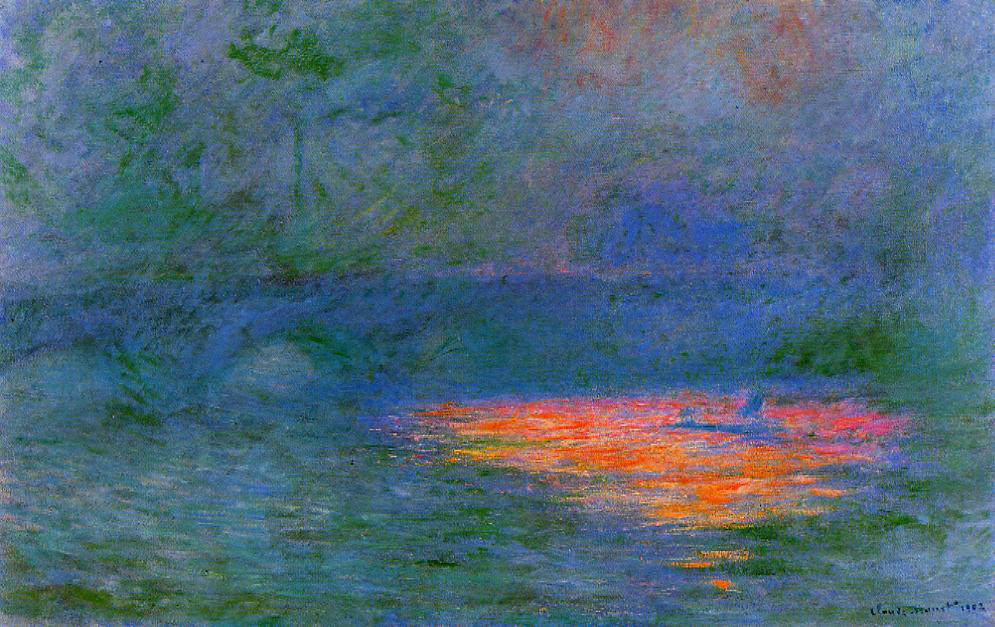

In [2]:
Image.open("images/7618.jpg")

This image contains three bands of data: R, G and B. This means each pixel is encoded with with a value ranging 0-255 for each of the Red, Green and Blue bands. We can extract this information as a list of 3-tuples using the PIL Image module function getdata().

In [3]:
pix_val = list(im.getdata())
print pix_val[:4]

[(134, 151, 203), (125, 143, 193), (119, 137, 183), (116, 138, 177)]


Alternatively we can get counts for each observed 3-tuple using the Image function getcolors(). This function takes as an argument the maximum number of colours, which by default is 256. If the number of colours found exceeds maxcolors the function will return None, which isn't really what we want. To make sure we capture all of the colours we instead pass the number of pixels in the image obtained from the image attribute size (im.size). As we will be working from the thumbnail versions to assess dominant colours we handling overly large image files. If the thumbnails hadn't been scraped I would recommend first reducing the size of the images using the Image function [resize()](http://effbot.org/imagingbook/image.htm#tag-Image.Image.resize).

In [4]:
w, h = im.size
pix_count = im.getcolors(maxcolors = w*h)
print pix_count[:10]

[(2, (71, 107, 121)), (1, (42, 81, 114)), (2, (66, 98, 123)), (4, (89, 107, 147)), (1, (84, 101, 144)), (3, (67, 98, 93)), (1, (45, 74, 106)), (1, (81, 107, 164)), (2, (95, 107, 121)), (1, (33, 74, 126))]


## Implementing k-Means Clustering

In [5]:
import pandas as pd

pix = pd.DataFrame(pix_val, columns=['r', 'g', 'b'])

In [6]:
%matplotlib inline
from plotRGB import plotRGB

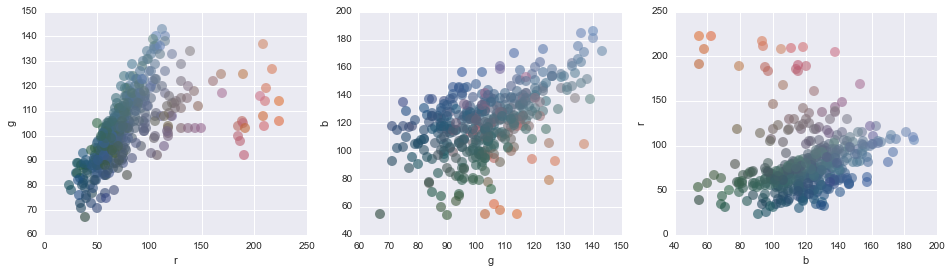

In [7]:
pix_sample = pix.sample(400)
plotRGB(pix_sample)

As far as classification methods go, *k*-means clustering is pretty straightforward to understand. First thing we need to do is choose a starting point for our *k* 'centroids', that will drift (we hope) toward the middles the clusters. We have to decide for ourselves just how many clusters to initialize. In this example, looking at both the image and the scatter plots coded by colour, 3 seems about right, hopefully capturing the dominant Blue, Green and Orange tones.

Now there are a number of possible strategies for initializing the centroids. One option is to simply choose *k* random points. The trouble with that is we are pretty likely to end up choosing multiple points from the same cluster. Though the *k*-means clustering algorithm is guaranteed to converge to a solution, that solution is generally not unique and is affected by the initial centroid locations, so it would be preferable to avoid choosing starting points that are close together in the same cluster.

A better heuristic is to start from *k* points that are far apart. So why not the farthest apart? To do this we will choose the first centroid randomly from the data. The second centroid will be the data point with the farthest Euclidean distance from the first centroid. And the centroids selected after that will be the point with the largest minimum distance to all previously selected centroids. 

In [9]:
from sklearn.utils import check_random_state
import numpy as np

def _distance(v1, v2):
    return np.sqrt(np.sum((v1 - v2) ** 2))

def _max_min_dist_centroid(centroids, X):  
    n_clusters = centroids.shape[0]
    n_sample = X.shape[0]

    min_dist = np.empty((n_sample, 1))
    min_dist.fill(np.infty)
    
    # Compute Euclidean distance between each point and each of
    # the centroids.
    for xi in range(n_sample):
        for ci in range(n_clusters):
            # If the Euclidean distance between this centroid and the data
            #  point is less than the previous minimum distance, then save it!
            min_dist[xi] = min(min_dist[xi], _distance(X[xi], centroids[ci]))
    
    # Return the data point with the largest minimum distance
    return X[ min_dist.argmax() ]

def _init_centroids(X, k, random_seed=None):
    
    n_sample = X.shape[0]
    n_features = X.shape[1]
    
    centroids = np.zeros((k, n_features))
    
    # The first centroid chosen at random
    random_state = check_random_state(random_seed)
    centroids[0] = X[random_state.randint(X.shape[0])]
    
    # Add a new centroid each iteration
    # the data point with the largest minimum distance to previously
    # selected centroids.
    for centi in range(1,k):
        centroids[centi] = _max_min_dist_centroid(centroids[:centi], X)
        
    return centroids

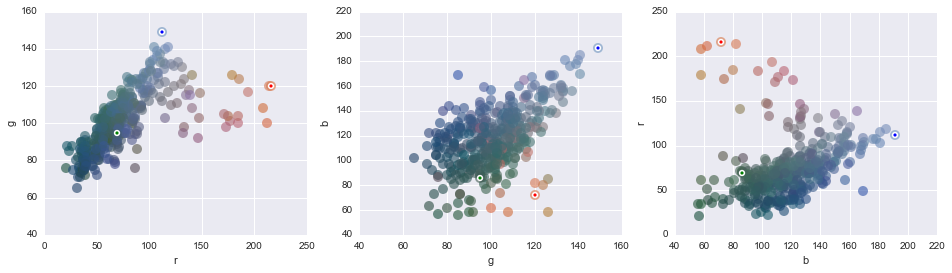

In [10]:
pix_sample = pix.sample(400)
initial_centroids = _init_centroids(pix_sample.as_matrix(),3)

plotRGB(pix_sample, initial_centroids)

Now that there's a place to start, the next step is to iterate over each data point and assign it to the nearest cluster centroid.

In [11]:
def _assign_cluster(X, centroids):
    
    n_sample = X.shape[0]
    n_clusters = centroids.shape[0]
    
    labels = -np.ones((n_sample), dtype = int)
    
    for xi in range(n_sample):
        min_dist = np.infty
        for ci in range(n_clusters):
            dist = _distance(X[xi], centroids[ci])
            if (dist < min_dist):
                labels[xi] = ci
                min_dist = dist
    
    return labels

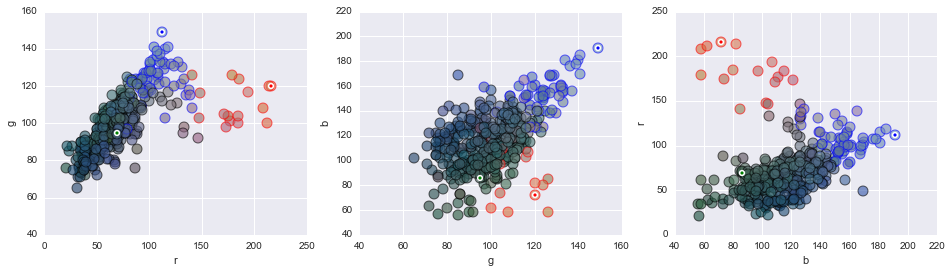

In [16]:
labels = _assign_cluster(pix_sample.as_matrix(), initial_centroids)
plotRGB(pix_sample, initial_centroids, labels)

Great! So now we can update the centroids by taking the mean of the points assigned to each cluster.

In [14]:
def _update_clusters(X, labels, k):
    
    n_sample = X.shape[0]
    n_features = X.shape[1]
    
    sum_data = np.zeros((k,n_features))
    count = np.zeros(k)
    
    for xi in range(n_sample):
        sum_data[labels[xi]] += X[xi]
        count[labels[xi]] += 1
    
    for ci in range(k):
        sum_data[ci] /= count[ci]

    return sum_data

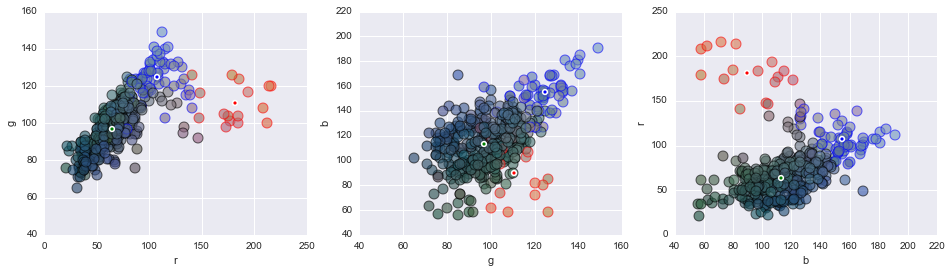

In [17]:
new_centroids = _update_clusters(pix_sample.as_matrix(), labels, 3)
plotRGB(pix_sample, new_centroids, labels)

Fantastic! Making progress! What do we do next? Update the labels for each observation based on the latest and greatest centroids. Again, we'll check each point and assign it to a cluster based on whichever centroid has the shortest Euclidean distance.

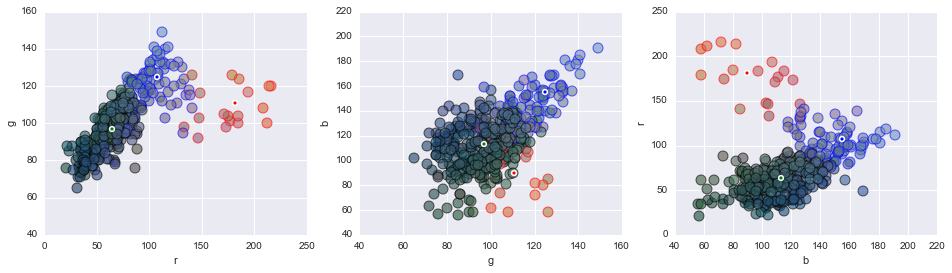

In [19]:
labels = _assign_cluster(pix_sample.as_matrix(), new_centroids)
plotRGB(pix_sample, new_centroids, labels)

And what do we do now that the clusters have changed slightly again? Update the clusters of course! I'm sure you're detecting a theme, but when do we get to stop? This raises an excellent point, we have not established a stopping criteria.

In *k*-means clustering we aim to minimize the within-cluster sum of squares (WCSS) and the algorithm will have converged to a (local) optimum when the assigments to clusters no longer change, or equivalently when the centroids do not change from one iteration to the next. Typically this occurs in a handful of iterations, but to be on the safe side we will also set a maximum on the number of iterations as a back-up stopping point.

In [20]:
def kmeans(X, k, maxiter=1000, random_seed=None, verbose = False):
    
    centroids = _init_centroids(X,k,random_seed)
    labels = _assign_cluster(X, centroids)
    
    for iter in range(maxiter):
            
        new_centroids = _update_clusters(X, labels, k)
        labels = _assign_cluster(X, new_centroids)
        
        if (verbose): print new_centroids
        
        if (new_centroids == centroids).all():
            break
        
        centroids = new_centroids
    
    if (verbose): 
        print "Converged in ", iter, "iterations"
        print centroids
        
    return labels, centroids

This much works, but recall that when the assignments stop changing we have converged to a *local* optimum. The results are dependent on the initial random selection. In fact, if we can see there are a few spots that it likes to settle.

In [21]:
for i in range(5):
    labels, centroids = kmeans(pix_sample.as_matrix(), 3)
    print "Centroids ", i
    print centroids

Centroids  0
[[  56.52320675   93.02109705  105.65822785]
 [ 177.05555556  109.           92.72222222]
 [  91.63448276  114.12413793  140.74482759]]
Centroids  1
[[  56.52320675   93.02109705  105.65822785]
 [ 177.05555556  109.           92.72222222]
 [  91.63448276  114.12413793  140.74482759]]
Centroids  2
[[  89.9602649   113.77483444  139.9205298 ]
 [ 173.3         109.4          96.25      ]
 [  55.98253275   92.52401747  105.08733624]]
Centroids  3
[[  89.9602649   113.77483444  139.9205298 ]
 [ 173.3         109.4          96.25      ]
 [  55.98253275   92.52401747  105.08733624]]
Centroids  4
[[  56.52320675   93.02109705  105.65822785]
 [ 177.05555556  109.           92.72222222]
 [  91.63448276  114.12413793  140.74482759]]


How to choose, right? It seems that repeating the *k*-means algorithm a few times, initializing with a different 'furthest-apart' centroid would be a good idea. But once we have, how are we to choose between them? For that we will come back to the within-centroid sum of squares (WCSS), and choose the solution with the smallest WCSS. We have not yet written a function save the distances between the centroids and the cluster data points, but we did in fact calculate it in the function _assign_clusters(X, centroids)...we just didn't save that information! So lets edit that function first.

$$ \sum_{c=1}^{k}{ \sum_{x \in S_{c}}{ \lVert x - \mu_c \rVert } } $$

In [22]:
def _assign_cluster(X, centroids):
    
    n_sample = X.shape[0]
    n_clusters = centroids.shape[0]
    
    labels = -np.ones((n_sample), dtype = int)
    WCSS = 0
    
    for xi in range(n_sample):
        min_dist = np.infty
        for ci in range(n_clusters):
            dist = _distance(X[xi], centroids[ci])
            if (dist < min_dist):
                labels[xi] = ci
                min_dist = dist
        # sum of the euclidean distances to nearest centroid        
        WCSS += min_dist
    
    return labels, WCSS

In [23]:
def _kmeans_once(X, k, maxiter=1000, random_seed=None, verbose=False):
    
    centroids = _init_centroids(X,k,random_seed)
    labels, WCSS = _assign_cluster(X, centroids)
    
    for iter in range(maxiter):
            
        new_centroids = _update_clusters(X, labels, k)
        labels, WCSS = _assign_cluster(X, new_centroids)
        
        if (verbose): print new_centroids
        
        if (new_centroids == centroids).all():
            break
        
        centroids = new_centroids
    
    if (verbose): 
        print "Converged in ", iter, "iterations"
        print centroids
    
    return labels, centroids, WCSS

In [24]:
def kmeans( X, k, n_init=10, maxiter=1000, random_seed=None, verbose = False ):
    
    n_sample = X.shape[0]
    n_features = X.shape[1]
    
    best_WCSS = np.infty
    best_labels = -np.ones((n_sample), dtype = int)
    best_centroids = np.zeros((k, n_features))
    
    for iter in range(n_init):
        labels, centroids, WCSS = _kmeans_once(X, k, maxiter=maxiter, random_seed=random_seed)
        if (verbose):
            print "Iteration ", iter, " WCSS = ", WCSS
            print centroids
        if (WCSS < best_WCSS):
            best_labels, best_centroids, best_WCSS = labels, centroids, WCSS
    
    best_centroids
    
    return best_labels, best_centroids, best_WCSS

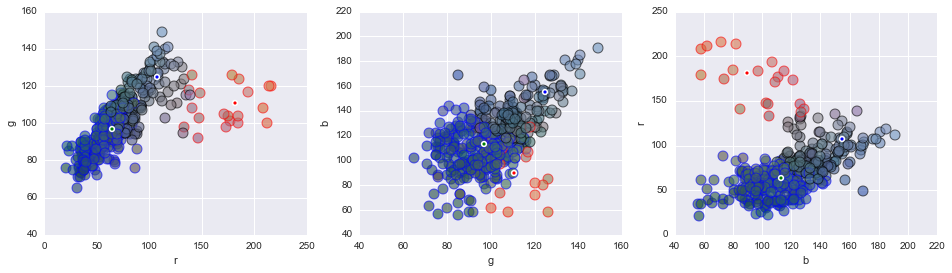

In [26]:
labels, centroids, WCSS = kmeans(pix_sample.as_matrix(), 3)
plotRGB(pix_sample, new_centroids, labels)

We have been working from a sample thus far so the graphs didn't get too busy, so we'll switch to the full thumbnail image from here.

In [27]:
labels, centroids, WCSS = kmeans(pix.as_matrix(), 3, verbose=False, n_init=5)

The result is three points worth of RBG values!

In [31]:
print centroids

[[  90.4387264   113.52202888  139.19751944]
 [  57.13906021   93.11982379  105.00587372]
 [ 170.67376682  110.86995516   95.47982063]]


To inspect the result, next we open the full sized image and draw the three circles in the corner to demonstrate the colour palette.

In [41]:
from PIL import Image, ImageDraw

def colorPalette(inimage, outimage, colours):

    im = Image.open(inimage)
    draw = ImageDraw.Draw(im)

    w, h = im.size
    r = int(0.1 * w)
    pad = (.25 * r)
    count = 0
    
    for colour in colours:
        fill = "rgb(" + str(int(colour[0])) + "," + str(int(colour[1])) + "," + str(int(colour[2])) + ")"
        draw.ellipse((pad + count * (pad + r), pad, pad + count * (pad + r) + r, pad + r), fill = fill, outline ='black')
        count += 1

    im.save(outimage)

All told not a terrible representation of this image. This captures a green-ish shade, a blue-purple shade and an orange shade.

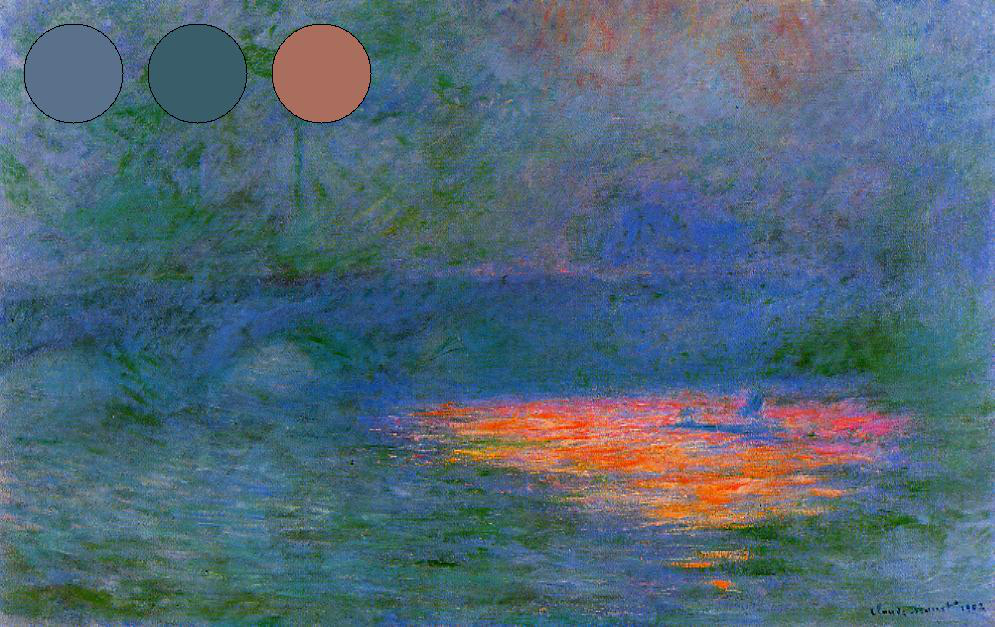

In [47]:
colorPalette("images/7618.jpg", 'test.jpg', centroids)
Image.open('test.jpg')

We can also experiment with adding more colour 'clusters'. In this case we get more of a blue and more of a green, but also a muted purple and grey-blue.

In [55]:
labels, centroids, WCSS = kmeans(pix.as_matrix(), 5, verbose=False, n_init=5)

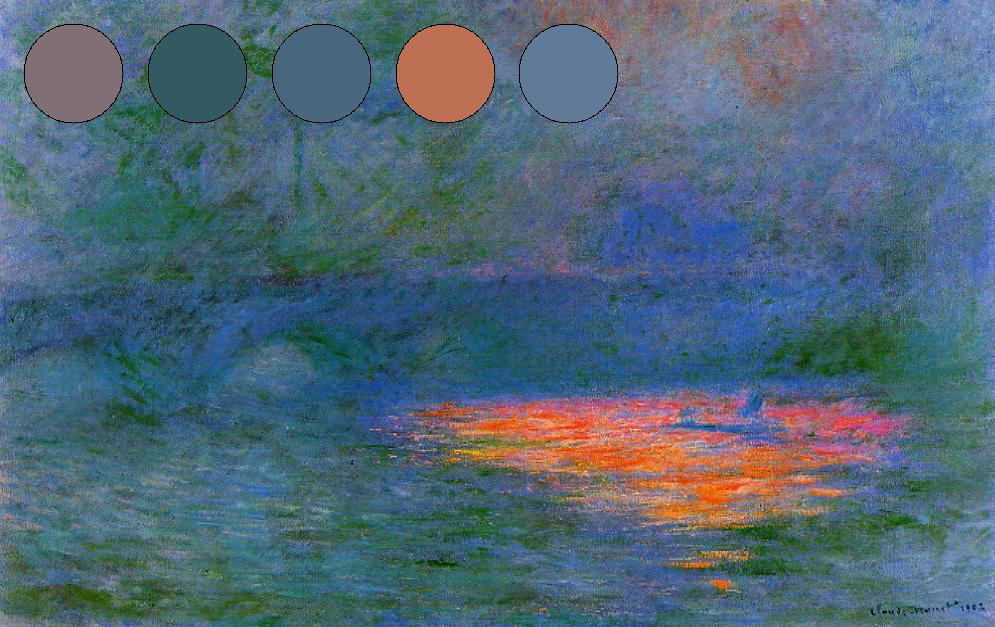

In [57]:
colorPalette("images/7618.jpg", 'test_2.jpg', centroids)
Image.open('test_2.jpg')

Of course *k*-means clustering isn't exactly new, and more efficient implementations are plentiful. To double-check the results, we'll try again using the scikit-learn KMeans method. Though the model fits much more quickly, the results are not different.

In [60]:
from sklearn.cluster import KMeans
k_means = KMeans(init='k-means++', n_clusters=3, n_init=10)
k_means.fit(pix)
k_means_labels = k_means.labels_
centroids = k_means.cluster_centers_
k_means_labels_unique = np.unique(k_means_labels)

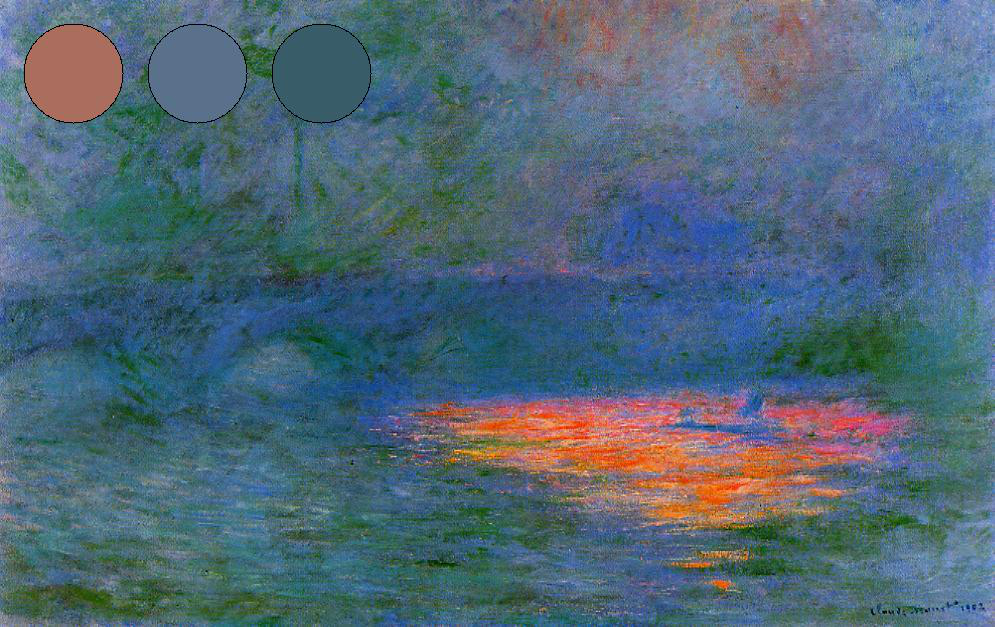

In [61]:
colorPalette("images/7618.jpg", 'test_2.jpg', centroids)
Image.open('test_2.jpg')

# But Can We Do Better?

## Taking the most common pixel value from the set

Averaging the colours results in something very muddy, which isn't altogether satisfying. Perhaps a better solution than taking the centroid values, which are the average of a set of RGB tuples, would be to take the most common value within a cluster.

In [112]:
from __future__ import division

In [113]:
pixrd = [ tuple( int(round(d / 10, 0) * 10) for d in rgb ) for rgb in pix_val]

In [116]:
from collections import Counter
common_cols = [];

for c in range(len(centroids)):
    pix_group = [ i for i,j in zip(pixrd,labels) if j == c]
    pixcount = Counter(pix_group)
    common_cols.append(pixcount.most_common(1)[0][0])
    
print common_cols

[(127, 122, 128), (56, 96, 96), (76, 110, 109)]


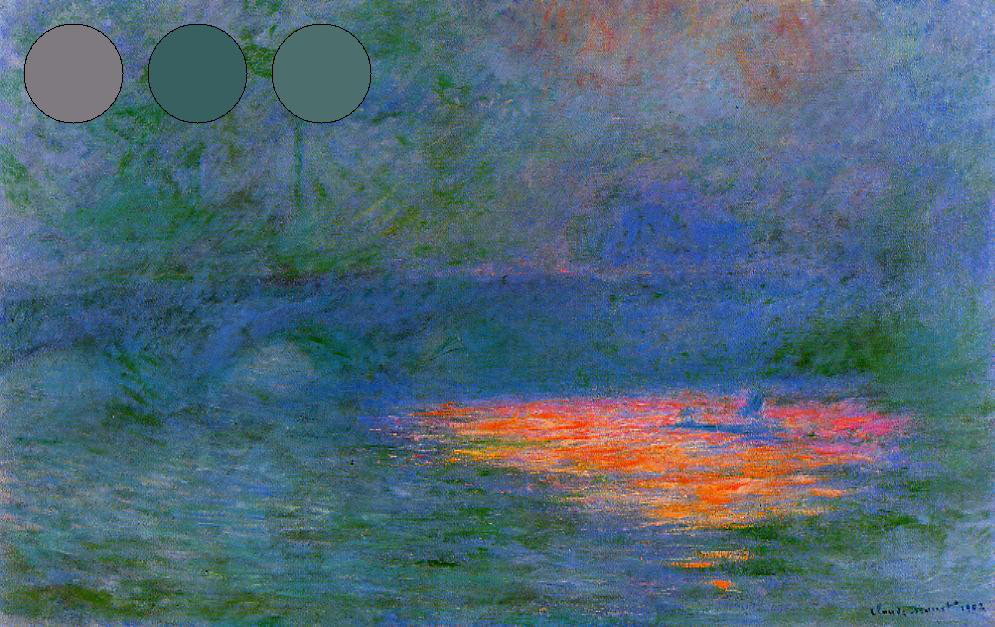

In [117]:
colorPalette("images/7618.jpg", 'test_pick_colour.jpg', common_cols)
Image.open('test_pick_colour.jpg')

Nope! That wasn't good at all!!

## Cluster on a Subset of Pixels

When a human observer chooses the 'dominant colours' in an image, they are basing their choices on the colours that are most salient. It stands to reason then that we might improve our result by filtering out colours that are not very saturated before we make our choices.

In [168]:
chroma = [ max(rgb)/255 - min(rgb)/255 for rgb in pix_val ]

In [169]:
value = [ max(rgb)/255 for rgb in pix_val ]

In [219]:
sat = [ 0 if v==0 else c/v for c,v in zip(chroma,value) ]

In [216]:
pix_val_filter = pd.DataFrame([ p for c,v,p in zip(chroma,value,pix_val) if c>.3 and v>.1 ], columns=("r","g","b"))

In [252]:
pix_val_filter = pd.DataFrame([ p for s,p in zip(sat,pix_val) if s>.8 ], columns=("r","g","b"))

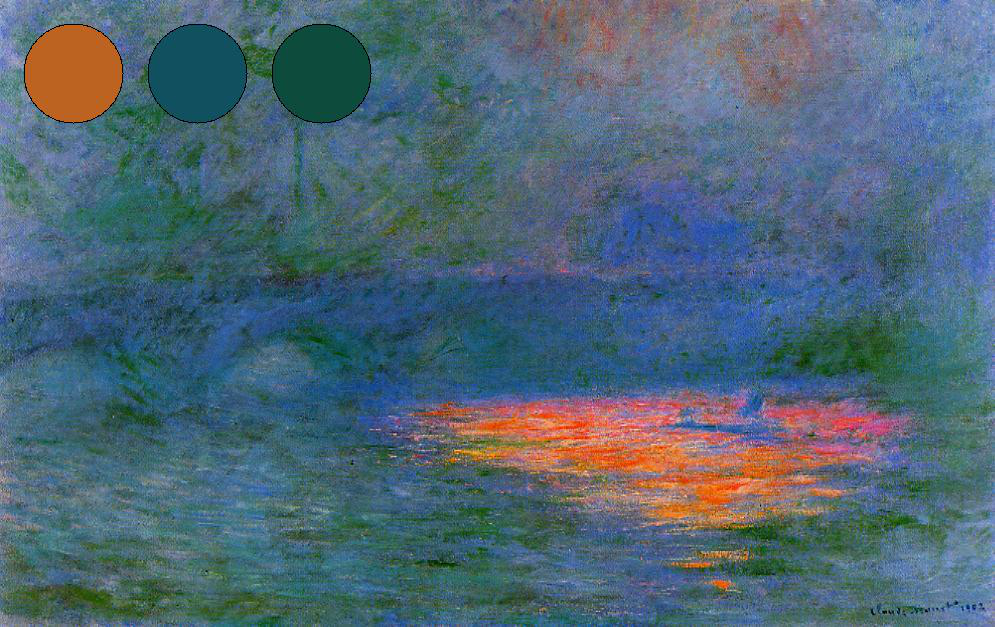

In [316]:
from sklearn.cluster import KMeans
k_means = KMeans(init='k-means++', n_clusters=3, n_init=10)
k_means.fit(pix_val_filter)
k_means_labels = k_means.labels_
centroids = k_means.cluster_centers_
k_means_labels_unique = np.unique(k_means_labels)

colorPalette("images/7618.jpg", 'test_FilterChromaValue.jpg', centroids)
Image.open('test_FilterChromaValue.jpg')

## Increase Saturation of All Pixels

In [547]:
from PIL import Image
# Use thumbnail version as dataset
im = Image.open("images/7618.jpg")

pix_val = list(im.getdata())

In [548]:
import numpy as np
from __future__ import division

def convertRGBtoHSL(rgb):
    if (max(rgb) > 1):
        rgb = [c/255 for c in rgb]
    
    maxrgb = max(rgb)
    minrgb = min(rgb)
    
    L = ( maxrgb + minrgb ) / 2
    
    # If R==B==G then grey -> no saturation
    if ( maxrgb == minrgb ):
        S = 0
        H = 0
        return( (H,S,L) )
    
    if (L < 0.5):
        S = ( maxrgb - minrgb ) / ( maxrgb + minrgb )
    else:
        S = ( maxrgb - minrgb ) / (2 - maxrgb - minrgb )
    
    if (np.argmax(rgb) == 0):
        H = (rgb[1] - rgb[2]) / ( maxrgb - minrgb )
    elif (np.argmax(rgb) == 1):
        H = 2 + (rgb[2] - rgb[0]) / ( maxrgb - minrgb )
    else:
        H = 4 + (rgb[0] - rgb[1]) / ( maxrgb - minrgb )
    
    H = H * 60
    if (H < 0): 
        H += 360
     
    return( (H,S,L) )
    
def convertHSLtoRGB(hsl):
    
    H,S,L = hsl
    
    # No saturation then grey
    if (S == 0):
        return( (255*L, 255*L, 255*L) )
    
    if (L < .5):
        t1 = L * (1 + S)
    else:
        t1 = L + S - L*S
    
    t2 = 2*L - t1
    
    H = H / 360
    
    R = H + 0.333
    G = H
    B = H - 0.333
   
    def convertC( C ):
        if C > 1: C += -1
        if C < 0: C += 1
        if 6*C < 1:
            C = t2 + 6 * (t1 - t2) * C
        elif 2*C < 1:
            C = t1
        elif 3*C < 2:
            C = t2 + 6 * (t1 - t2) * (0.666 - C)
        else:
            C = t2
        return C
    
    R = int(255 * convertC(R))
    G = int(255 * convertC(G))
    B = int(255 * convertC(B))
        
    return( (R,G,B))

In [555]:
pix_val_hsl = [ convertRGBtoHSL(p) for p in pix_val ]

In [556]:
pix_val_hsl_sat = [ (hsl[0], 1.5 * hsl[1], hsl[2]) for hsl in pix_val_hsl]

In [557]:
pix_val_rgb_sat = [ convertHSLtoRGB(p) for p in pix_val_hsl_sat ]

In [558]:
pix_val_rgb_sat = [ (int(rgb[0]),int(rgb[1]),int(rgb[2])) for rgb in pix_val_rgb_sat]

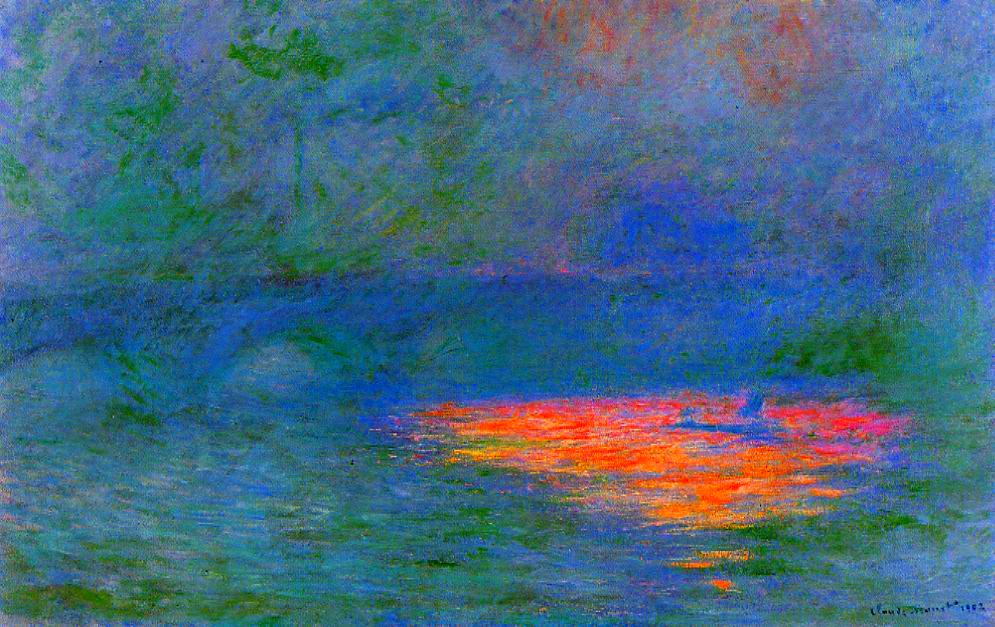

In [559]:
w, h = im.size

img_sat = Image.new( 'RGB', (w,h)) 
img_sat.putdata(pix_val_rgb_sat)

img_sat

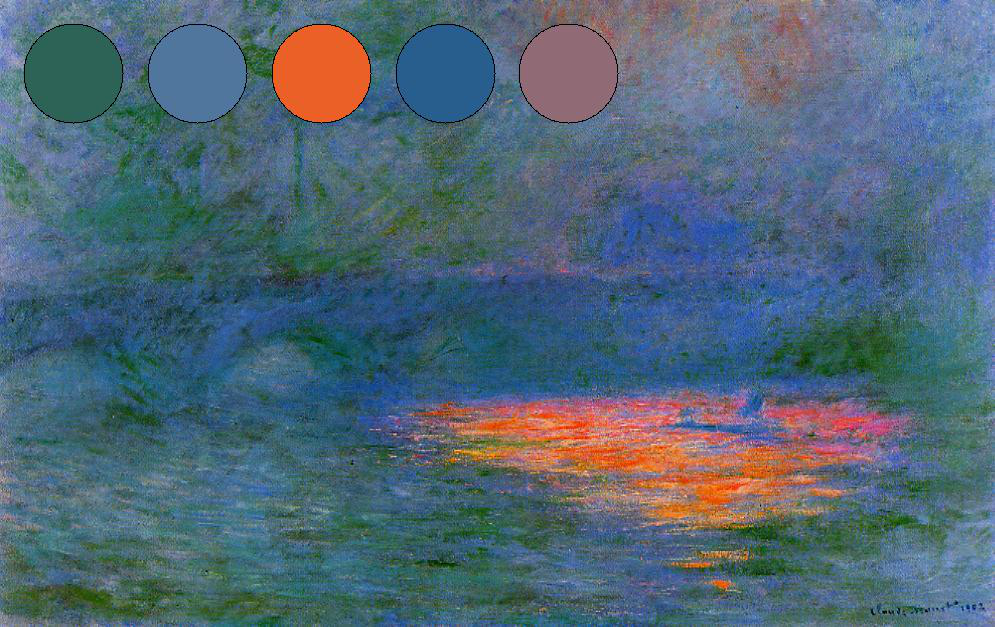

In [560]:
from sklearn.cluster import KMeans
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10)
k_means.fit(pix_val_rgb_sat)
k_means_labels = k_means.labels_
centroids = k_means.cluster_centers_
k_means_labels_unique = np.unique(k_means_labels)

colorPalette("images/7618.jpg", 'test_saturate.jpg', centroids)
Image.open('test_saturate.jpg')

## Image "Enhance" Color

In [533]:
from PIL import Image
# Use thumbnail version as dataset
im = Image.open("images/7618.jpg")

pix_val = list(im.getdata())

In [534]:
pix_val_grey = [ int( (0.21 * rgb[0] + 0.72 *rgb[1] + 0.07 *rgb[2]) ) for rgb in pix_val ] 

In [539]:
pix_val_enhance = [ tuple( int(min(max( c+0.5*(c - gr),0 ),255)) for c in rgb) for rgb,gr in zip(pix_val,pix_val_grey) ]

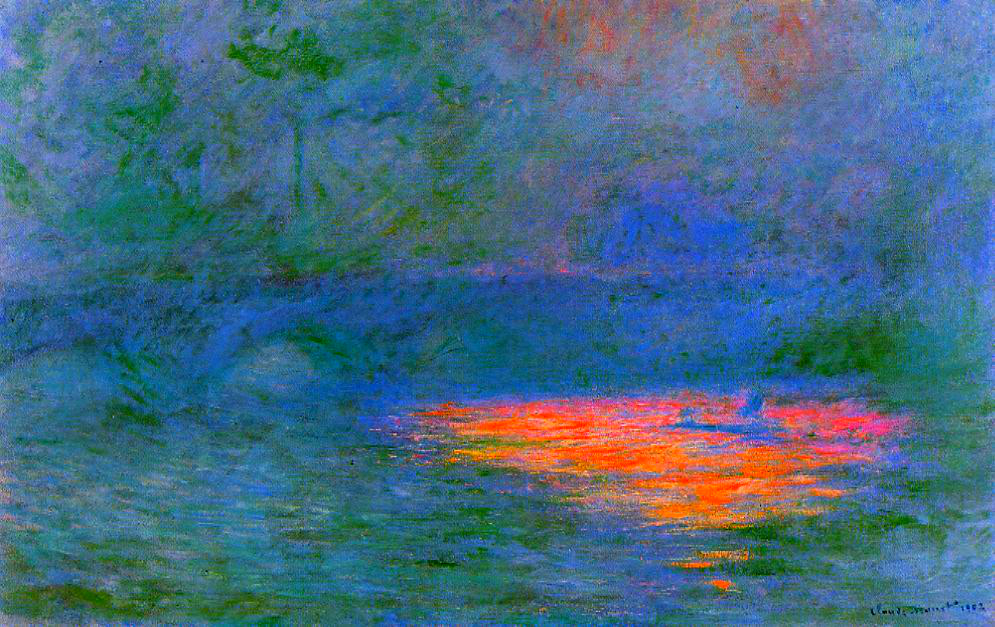

In [540]:
w, h = im.size

img_sat = Image.new( 'RGB', (w,h)) 
img_sat.putdata(pix_val_enhance)

img_sat

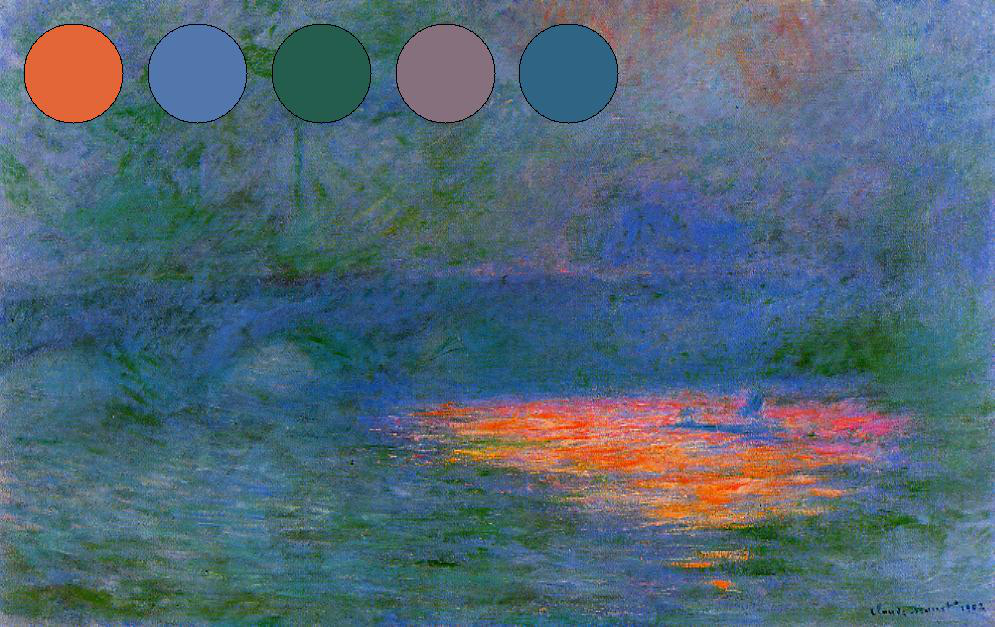

In [541]:
from sklearn.cluster import KMeans
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10)
k_means.fit(pix_val_enhance)
k_means_labels = k_means.labels_
centroids = k_means.cluster_centers_
k_means_labels_unique = np.unique(k_means_labels)

colorPalette("images/7618.jpg", 'test_enhance.jpg', centroids)
Image.open('test_enhance.jpg')

In [ ]:
from PIL import Image
from sklearn.cluster import KMeans
import pandas as pd

data = pd.read_csv('monet_data.csv')

data['cluster_count'] = "-1"

for i in range(data.shape[0]):
    print "images/" + str(data.file_id_full[i])  + ".jpg"
    im = Image.open("images/" + str(data.file_id_full[i])  + ".jpg")
    pix_val = list(im.getdata())
    pix_val_grey = [ int( (0.21 * rgb[0] + 0.72 *rgb[1] + 0.07 *rgb[2]) ) for rgb in pix_val ] 
    pix_val_enhance = [ tuple( int(min(max( c+0.5*(c - gr),0 ),255)) for c in rgb) for rgb,gr in zip(pix_val,pix_val_grey) ]

    k_means = KMeans(init='k-means++', n_clusters=5, n_init=10)
    k_means.fit(pix_val_enhance)
    k_means_labels = k_means.labels_
    centroids = k_means.cluster_centers_

    colorPalette("images/" + str(data.file_id_full[i])  + ".jpg", "palette/" + str(data.file_id_full[i])  + "_enhance.jpg", centroids)
    
    cluster_count = {}
    colours = [ tuple(int(c) for c in rgb) for rgb in centroids.tolist() ]
    for label in k_means_labels:
        cluster_count[colours[label]] = cluster_count.get(colours[label],0) + 1
    data['cluster_count'][i]=str(cluster_count)

    data.to_csv('monet_data_w_cluster.csv')

images/154481.jpg
images/571312.jpg
images/7956.jpg
images/8172.jpg
images/6595.jpg

In [15]:
from PIL import Image, ImageDraw
from sklearn.cluster import KMeans
import pandas as pd
import sys

def colorPalette(inimage, outimage, colours):

    im = Image.open(inimage)
    draw = ImageDraw.Draw(im)

    w, h = im.size
    r = int(0.1 * w)
    pad = (.25 * r)
    count = 0
    
    for colour in colours:
        fill = "rgb(" + str(int(colour[0])) + "," + str(int(colour[1])) + "," + str(int(colour[2])) + ")"
        draw.ellipse((pad + count * (pad + r), pad, pad + count * (pad + r) + r, pad + r), fill = fill, outline ='black')
        count += 1

    im.save(outimage)

data = pd.read_csv('monet_data_w_cluster.csv')

for i in range(data.shape[0]):
    if (data.cluster_count[i] == '-1'):
        print "images/" + str(data.file_id_full[i])  + ".jpg"
        print "processing image"
        try:
            im = Image.open("images/" + str(data.file_id_full[i])  + ".jpg")
            pix_val = list(im.getdata())
            pix_val_grey = [ int( (0.21 * rgb[0] + 0.72 *rgb[1] + 0.07 *rgb[2]) ) for rgb in pix_val ] 
            pix_val_enhance = [ tuple( int(min(max( c+0.5*(c - gr),0 ),255)) for c in rgb) for rgb,gr in zip(pix_val,pix_val_grey) ]

            k_means = KMeans(init='k-means++', n_clusters=5, n_init=10)
            k_means.fit(pix_val_enhance)
            k_means_labels = k_means.labels_
            centroids = k_means.cluster_centers_

            colorPalette("images/" + str(data.file_id_full[i])  + ".jpg", "palette/" + str(data.file_id_full[i])  + "_enhance.jpg", centroids)

            cluster_count = {}
            colours = [ tuple(int(c) for c in rgb) for rgb in centroids.tolist() ]
            for label in k_means_labels:
                cluster_count[colours[label]] = cluster_count.get(colours[label],0) + 1
            data['cluster_count'][i]=str(cluster_count)

            data.to_csv('monet_data_w_cluster.csv')
        except:
            e = sys.exc_info()[0]
            print "<p>Error: %s</p>" % e
    else:
        print "already done."

already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
already done.
alread

/Users/carriesmith/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [13]:
i

1153

In [17]:
data = pd.read_csv('monet_data_w_cluster.csv')



'{(76, 84, 111): 16309, (105, 136, 172): 21005, (171, 169, 194): 7995, (116, 130, 113): 23020, (101, 92, 41): 13571}'

In [19]:
data.cluster_count[1] != '-1'

True